In [1]:
## Import Libraries
import pandas as pd
import numpy as np

import re
import spacy
import string
import nltk

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from urllib.parse import unquote
import urllib3
from bs4 import BeautifulSoup

from gensim.summarization import keywords
from collections import Counter
import collections

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.model_selection import train_test_split

from sklearn.svm import SVC

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import roc_curve
from sklearn.metrics import auc

import warnings
warnings.filterwarnings('ignore')

In [2]:
# libraries for text data collection

# Importing packges
# Run this first before all code
from __future__ import unicode_literals
import os
import time
fpath = os.getcwd()
print (fpath)

import json
from feedparser import parse
from requests import get
from bs4 import BeautifulSoup
from selenium import webdriver
import pandas as pd

TIMEOUT = 30
jsonlist = []

C:\Users\danie\Documents\Data Science\Institute of Data\mod7\weekly presentations


In [3]:
import re, sys

def removeIndent(phrase):
    phrase=re.sub("\n",' ',phrase)
    phrase=re.sub("\r",' ',phrase)
    phrase=re.sub("\t",' ',phrase)
    return phrase

def removeWS(phrase):
    phrase=re.sub(' ','',phrase)
    return phrase

def removePunc(phrase):
    phrase=re.sub('&',' and ',phrase)
    phrase=re.sub(u"\"","\'", phrase)
    phrase=re.sub("\%","percent",phrase)
  #  phrase=re.sub(',','\,',phrase)
    return phrase

In [4]:
# urls of CNA articles
cna_urls = ['https://www.channelnewsasia.com/news/asia/covid-19-hong-kong-reopen-gyms-massage-parlours-13075264',
           'https://www.channelnewsasia.com/news/singapore/younger-more-diverse-parliament-faces-jobs-challenge-covid-19-13045600'
           'https://www.channelnewsasia.com/news/commentary/covid-19-coronavirus-rules-masks-social-distancing-fines-13062128',
           'https://www.channelnewsasia.com/news/singapore/singapore-brunei-green-lane-travel-covid-19-13071136',
           'https://www.channelnewsasia.com/news/business/millennium-hotels-resorts-retrench-layoff-159-staff-covid-19-13034592']

In [5]:
# urls of SCMP articles
scmp_urls = ['https://www.scmp.com/comment/opinion/article/3099671/how-coronavirus-pandemic-deepening-asias-pension-crisis',
            'https://www.scmp.com/sport/hong-kong/article/3098052/cough-carrie-lam-hong-kongs-sports-coaches-need-cash-survive-covid',
            'https://www.scmp.com/news/hong-kong/hong-kong-economy/article/3098835/hong-kongs-industry-leaders-call-further-easing',
            'https://www.scmp.com/week-asia/politics/article/3099907/singapores-pm-lee-hsien-loong-concedes-coronavirus-response',
            'https://www.scmp.com/magazines/style/news-trends/article/3097857/despite-covid-19-singapore-real-estate-remains-hot']

In [6]:
# urls of YahooNews articles
yahoo_urls = ['https://news.yahoo.com/m-doctor-hong-kong-police-063400710.html',
             'https://finance.yahoo.com/news/singapore-expat-jobs-under-threat-210000051.html']

# Web Scraping

### Create a dataframe to store the articles

In [7]:
df = pd.DataFrame(columns=['Article_No','Source','Date','Country','Content','Clean_Content'], dtype = object)
df

,Article_No,Source,Date,Country,Content,Clean_Content


## Load an article from web
Load article - url.
Use BeautifulSoup to extract the content

In [8]:
# assign the url
quote_page = 'https://www.channelnewsasia.com/news/asia/covid-19-hong-kong-reopen-gyms-massage-parlours-13075264'

# query the website and return the html to the variable ‘page’

http = urllib3.PoolManager()
r = http.request('GET', quote_page)
if r.status == 200:
    page = r.data
    print('Type of the variable \'page\':', page.__class__.__name__)
    print('Page Retrieved. Request Status: %d, Page Size: %d' % (r.status, len(page)))
else:
    print('Some problem occurred. Request Status: %s' % r.status)

Type of the variable 'page': bytes
Page Retrieved. Request Status: 200, Page Size: 157020


In [9]:
# parse the html using beautiful soup and store in variable `soup`
soup = BeautifulSoup(page, 'html.parser')
print('Type of the variable \'soup\':', soup.__class__.__name__)

Type of the variable 'soup': BeautifulSoup


In [10]:
#print(soup.prettify()[:1000])

In [11]:
# Check the HTML's Title
print('Title tag :%s:' % soup.title)
print('Title text:%s:' % soup.title.string)

title = soup.title.string
print(title)

Title tag :<title>Hong Kong to reopen gyms, massage parlours as COVID-19 cases drop - CNA</title>:
Title text:Hong Kong to reopen gyms, massage parlours as COVID-19 cases drop - CNA:
Hong Kong to reopen gyms, massage parlours as COVID-19 cases drop - CNA


In [12]:
# Find the main content
# Check if it is possible to use only the relevant data

tag = 'article'
article = soup.find_all(tag)[0]
print('Type of the variable \'article\':', article.__class__.__name__)

Type of the variable 'article': Tag


In [13]:
# Get text from all <p> tags where <p> tags = paragraph
p_tags = soup.find_all('p') 

# Get text from each of the 'p' tags and strip surrounding whitespace
p_tags_text = [tag.get_text().strip() for tag in p_tags[1:]]


In [14]:
content = p_tags_text[:-3]
print(content)

['HONG KONG: Hong Kong will reopen gyms and massage parlours and extend night-time dining hours from Friday (Sep 4), easing tough coronavirus curbs as new daily infections in the Asian financial hub drop into the single digits.', "Restaurants will be allowed to stay open an hour beyond the current 9pm time, while fitness centres and places of amusement such as clubs, can reopen, said Sophia Chan, the city's health secretary.", 'However, a ban on gatherings of more than two people stays, Chan added, saying that while authorities in the city were relaxing some social distancing measures, residents needed to stay vigilant.', '"We have yet to see a stable situation," she told a news briefing. "Everyone must maintain a certain degree of social distancing."', "The announcement came as China's government offered mass virus testing for Hong Kong residents from this week.", 'The free voluntary tests are part of an attempt to stamp out a third wave of infections that began in late June and saw t

In [15]:
# Store article details as 1 observation in the dataframe
rec = {'Article_No' : 'A1','Source' :'CNA', 'Date' :'2020-09-02', 
       'Country': 'Hong Kong', 'Content' : str(content), 'Clean_Content' : ""}
df = df.append(rec, ignore_index = True )

In [16]:
df

,Article_No,Source,Date,Country,Content,Clean_Content
0,A1,CNA,2020-09-02,Hong Kong,['HONG KONG: Hong Kong will reopen gyms and ma...,


In [17]:
#df['Content'][1]

In [18]:
# export dataframe of articles as excel file
df.to_excel('articles.xlsx')

# Load Dataset

In [19]:
# import articles stored in excel file
dft = pd.read_excel('articles_data.xlsx')

In [20]:
dft

,Article_No,Source,Date,Country,Content,Clean_Content
0,A1,CNA,2020-09-02,Hong Kong,['HONG KONG: Hong Kong will reopen gyms and ma...,NaN
1,A2,CNA,2020-08-31,Hong Kong,"HONG KONG: In 1960, the Nobel laureate economi...",NaN
2,A3,CNA,2020-09-01,Singapore,SINGAPORE: Residents in Singapore and Brunei c...,NaN
3,A4,CNA,2020-08-19,Singapore,SINGAPORE: Millennium Hotels and Resorts has l...,NaN
4,A5,CNA,2020-08-24,Singapore,SINGAPORE: A younger and more gender-diverse P...,NaN
5,A6,SCMP,2020-09-02,Hong Kong,As the Covid-19 pandemic continues to overwhel...,NaN
6,A7,SCMP,2020-08-20,Hong Kong,*\tEight months since the start of the Covid-1...,NaN
7,A8,SCMP,2020-08-25,Hong Kong,*\tThe catering sector lost an estimated reven...,NaN
8,A9,SCMP,2020-09-02,Singapore,*\tCiting 'wisdom after the fact' to parliamen...,NaN
9,A10,SCMP,2020-08-19,Singapore,High-visibility projects like Marina Bay's The...,NaN


## Clean text

In [21]:
import nltk
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer
from string import punctuation

import en_core_web_sm




In [22]:
#### load spacy
nlp = en_core_web_sm.load()


In [23]:
def clean_text1(text):
    # reduce multiple spaces and newlines to only one
    text = re.sub(r'\\xa0', '', text)
    # remove double quotes
    text = re.sub(r'"', '', text)
    # remove tab
    text = re.sub(r'\t', '', text)
    # remove newline
    text = re.sub(r'\n', '', text)
    # remove ''s' and 's''char
    text = re.sub(r'\'s', '', text)   
    text = re.sub(r's\'s', '', text)
    return text

In [24]:
def convert_text(text):
    doc = nlp(text)
    tokens = [t for t in doc if not (t.is_stop|t.is_punct)]
    tokens = [t.lemma_ for t in tokens]
    clean_text = ' '.join(tokens).lower()
    return clean_text

In [25]:
%%time
dft['Content'] = dft['Content'].apply(clean_text1)
dft['Clean_Content'] = dft['Content'].apply(convert_text)

Wall time: 1.88 s


In [26]:
dft

,Article_No,Source,Date,Country,Content,Clean_Content
0,A1,CNA,2020-09-02,Hong Kong,['HONG KONG: Hong Kong will reopen gyms and ma...,hong kong hong kong reopen gym massage parlour...
1,A2,CNA,2020-08-31,Hong Kong,"HONG KONG: In 1960, the Nobel laureate economi...",hong kong 1960 nobel laureate economist ronald...
2,A3,CNA,2020-09-01,Singapore,SINGAPORE: Residents in Singapore and Brunei c...,singapore resident singapore brunei soon trave...
3,A4,CNA,2020-08-19,Singapore,SINGAPORE: Millennium Hotels and Resorts has l...,singapore millennium hotels resorts lay 159 em...
4,A5,CNA,2020-08-24,Singapore,SINGAPORE: A younger and more gender-diverse P...,singapore young gender diverse parliament open...
5,A6,SCMP,2020-09-02,Hong Kong,As the Covid-19 pandemic continues to overwhel...,covid-19 pandemic continue overwhelm economy a...
6,A7,SCMP,2020-08-20,Hong Kong,*Eight months since the start of the Covid-19 ...,month start covid-19 outbreak coach give measl...
7,A8,SCMP,2020-08-25,Hong Kong,*The catering sector lost an estimated revenue...,catering sector lose estimate revenue hk$5 bil...
8,A9,SCMP,2020-09-02,Singapore,"*Citing 'wisdom after the fact' to parliament,...",cite wisdom fact parliament lee say mandate we...
9,A10,SCMP,2020-08-19,Singapore,High-visibility projects like Marina Bay The F...,high visibility project like marina bay fuller...


In [27]:
# check content for text cleaning
#dft['Clean_Content'][14]

In [28]:
# check content for text cleaning
#dft['Content'][14]

# Sentiment Analysis

## TextBlob

Polarity is float which lies in the range of [-1,1] where 1 means positive statement and -1 means a negative statement. Subjective sentences generally refer to personal opinion, emotion or judgment whereas objective refers to factual information. Subjectivity is also a float which lies in the range of [0,1].

Let’s check the sentiment of our blob.



In [29]:
from textblob import TextBlob

In [30]:
dft['TextBlob_Sentiment_Polarity']=dft['Content'].apply(lambda x: TextBlob(x).sentiment.polarity)
dft['TextBlob_Sentiment_Polarity']

0     0.022451
1     0.067869
2    -0.084794
3     0.061568
4     0.116281
5     0.077108
6     0.067047
7     0.060071
8     0.152340
9     0.125848
10    0.029087
11    0.064848
12    0.098780
13    0.100244
14    0.099154
Name: TextBlob_Sentiment_Polarity, dtype: float64

In [31]:
dft['TextBlob_Sentiment_Subjectivity']=dft['Content'].apply(lambda x: TextBlob(x).sentiment.subjectivity)
dft['TextBlob_Sentiment_Subjectivity']

0     0.349177
1     0.365237
2     0.311697
3     0.355303
4     0.408497
5     0.369756
6     0.392764
7     0.395236
8     0.448464
9     0.406643
10    0.320810
11    0.383361
12    0.426536
13    0.428730
14    0.259945
Name: TextBlob_Sentiment_Subjectivity, dtype: float64

In [32]:
dft[dft['TextBlob_Sentiment_Polarity']<0]

,Article_No,Source,Date,Country,Content,Clean_Content,TextBlob_Sentiment_Polarity,TextBlob_Sentiment_Subjectivity
2,A3,CNA,2020-09-01,Singapore,SINGAPORE: Residents in Singapore and Brunei c...,singapore resident singapore brunei soon trave...,-0.084794,0.311697


## Vader Sentiment Analysis

VADER (Valence Aware Dictionary and sEntiment Reasoner) is a lexicon and rule-based sentiment analysis tool that is specifically attuned to sentiments expressed in social media. VADER uses a combination of A sentiment lexicon is a list of lexical features (e.g., words) which are generally labelled according to their semantic orientation as either positive or negative.

sentiment_analyzer_scores("The phone is super cool.")
The phone is super cool----------------- {'neg': 0.0, 'neu': 0.326, 'pos': 0.674, 'compound': 0.7351}


- The Positive, Negative and Neutral scores represent the proportion of text that falls in these categories. This means our sentence was rated as 67% Positive, 33% Neutral and 0% Negative. Hence all these should add up to 1.
- The Compound score is a metric that calculates the sum of all the lexicon ratings which have been normalized between -1(most extreme negative) and +1 (most extreme positive). In the case above, lexicon ratings for andsupercool are 2.9and respectively1.3. The compound score turns out to be 0.75 , denoting a very high positive sentiment.

In [33]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

In [34]:
sid_obj = SentimentIntensityAnalyzer()

In [35]:
dft['Vader_Sentiment_Compound']=dft['Content'].apply(lambda x: sid_obj.polarity_scores(x)['compound'])
dft['Vader_Sentiment_Compound']

0     0.6310
1     0.9895
2     0.8020
3     0.9364
4     0.9984
5     0.8554
6     0.9964
7     0.9614
8     0.8272
9     0.9982
10   -0.9984
11   -0.9928
12    0.9941
13    0.9637
14    0.9969
Name: Vader_Sentiment_Compound, dtype: float64

In [36]:
dft['Vader_Sentiment_neg']=dft['Content'].apply(lambda x: sid_obj.polarity_scores(x)['neg'])
dft['Vader_Sentiment_neg']

0     0.047
1     0.051
2     0.032
3     0.058
4     0.049
5     0.051
6     0.062
7     0.100
8     0.080
9     0.017
10    0.215
11    0.130
12    0.062
13    0.076
14    0.036
Name: Vader_Sentiment_neg, dtype: float64

In [37]:
dft['Vader_Sentiment_pos']=dft['Content'].apply(lambda x: sid_obj.polarity_scores(x)['pos'])
dft['Vader_Sentiment_pos']

0     0.065
1     0.087
2     0.056
3     0.073
4     0.096
5     0.079
6     0.104
7     0.112
8     0.099
9     0.114
10    0.078
11    0.047
12    0.098
13    0.099
14    0.176
Name: Vader_Sentiment_pos, dtype: float64

In [38]:
dft['Vader_Sentiment_neu']=dft['Content'].apply(lambda x: sid_obj.polarity_scores(x)['neu'])
dft['Vader_Sentiment_neu']

0     0.888
1     0.862
2     0.912
3     0.869
4     0.855
5     0.869
6     0.834
7     0.788
8     0.821
9     0.868
10    0.707
11    0.823
12    0.839
13    0.825
14    0.788
Name: Vader_Sentiment_neu, dtype: float64

In [39]:
dft['Vader_Sentiment']=dft['Vader_Sentiment_Compound'].apply(lambda x: 1 if x >= 0.05 else (-1 if x <= -0.05 else 0 ))
dft['Vader_Sentiment']


0     1
1     1
2     1
3     1
4     1
5     1
6     1
7     1
8     1
9     1
10   -1
11   -1
12    1
13    1
14    1
Name: Vader_Sentiment, dtype: int64

# NER analysis

In [40]:
ner = spacy.load("en_core_web_sm")

In [41]:
# HK Article_No A8 - original content
test = dft['Content'].iloc[7]
doc = ner(test)
spacy.displacy.render(doc, style = 'ent')

In [42]:
# HK Article_No A8 - Cleaned content for comparison with the original content
test = dft['Clean_Content'].iloc[7]
doc = ner(test)
spacy.displacy.render(doc, style = 'ent')

In [43]:
# SG Article_No A10 - original content
test = dft['Content'].iloc[9]
doc = ner(test)
spacy.displacy.render(doc, style = 'ent')

In [44]:
# SG Article_No A10 - cleaned content for comparison with original content
test = dft['Clean_Content'].iloc[9]
doc = ner(test)
spacy.displacy.render(doc, style = 'ent')

In [45]:
# create a new column for each tag category (Person, Org, Event, …) and
# count the number of found entities of each one


In [46]:
## tag text and exctract tags into a list
dft["tags"] = dft["Content"].apply(lambda x: [(tag.text, tag.label_) 
                                for tag in ner(x).ents] )

## utility function to count the element of a list
def utils_lst_count(lst):
    dic_counter = collections.Counter()
    for x in lst:
        dic_counter[x] += 1
    dic_counter = collections.OrderedDict(sorted(dic_counter.items(), 
                                 key=lambda x: x[1], reverse=True))
    lst_count = [ {key:value} for key,value in dic_counter.items() ]
    return lst_count

## count tags
dft["tags"] = dft["tags"].apply(lambda x: utils_lst_count(x))

## utility function create new column for each tag category
def utils_ner_features(lst_dics_tuples, tag):
    if len(lst_dics_tuples) > 0:
        tag_type = []
        for dic_tuples in lst_dics_tuples:
            for tuple in dic_tuples:
                type, n = tuple[1], dic_tuples[tuple]
                tag_type = tag_type + [type]*n
                dic_counter = collections.Counter()
                for x in tag_type:
                    dic_counter[x] += 1
        return dic_counter[tag]
    else:
        return 0




In [47]:
## extract features
tags_set = []
for lst in dft["tags"].tolist():
     for dic in lst:
        for k in dic.keys():
              tags_set.append(k[1])
tags_set = list(set(tags_set))
for feature in tags_set:
     dft["tags_"+feature] = dft["tags"].apply(lambda x: 
                             utils_ner_features(x, feature))



## print result
dft.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
Article_No,A1,A2,A3,A4,A5,A6,A7,A8,A9,A10,A11,A12,A13,A14,A15
Source,CNA,CNA,CNA,CNA,CNA,SCMP,SCMP,SCMP,SCMP,SCMP,YAHOO,YAHOO,YAHOO,YAHOO,YAHOO
Date,2020-09-02,2020-08-31,2020-09-01,2020-08-19,2020-08-24,2020-09-02,2020-08-20,2020-08-25,2020-09-02,2020-08-19,2020-09-02,2020-08-31,2020-08-27,2020-08-30,2020-08-29
Country,Hong Kong,Hong Kong,Singapore,Singapore,Singapore,Hong Kong,Hong Kong,Hong Kong,Singapore,Singapore,Hong Kong,Hong Kong,Singapore,Singapore,Singapore
Content,['HONG KONG: Hong Kong will reopen gyms and ma...,"HONG KONG: In 1960, the Nobel laureate economi...",SINGAPORE: Residents in Singapore and Brunei c...,SINGAPORE: Millennium Hotels and Resorts has l...,SINGAPORE: A younger and more gender-diverse P...,As the Covid-19 pandemic continues to overwhel...,*Eight months since the start of the Covid-19 ...,*The catering sector lost an estimated revenue...,"*Citing 'wisdom after the fact' to parliament,...",High-visibility projects like Marina Bay The F...,I am a Hong Kong trained doctor and have worke...,Hong Kong pro-democracy activists and healthca...,(Bloomberg) -- Singapore has long been the cit...,AUGUST 30 - They say only death and taxes are ...,The Monetary Authority of Singapore (MAS) said...
Clean_Content,hong kong hong kong reopen gym massage parlour...,hong kong 1960 nobel laureate economist ronald...,singapore resident singapore brunei soon trave...,singapore millennium hotels resorts lay 159 em...,singapore young gender diverse parliament open...,covid-19 pandemic continue overwhelm economy a...,month start covid-19 outbreak coach give measl...,catering sector lose estimate revenue hk$5 bil...,cite wisdom fact parliament lee say mandate we...,high visibility project like marina bay fuller...,hong kong train doctor work decade number publ...,hong kong pro democracy activist healthcare wo...,bloomberg singapore long city choice western e...,august 30 death taxis certain life fact avoid ...,monetary authority singapore mas say seek anch...
TextBlob_Sentiment_Polarity,0.0224514,0.0678694,-0.0847944,0.0615684,0.116281,0.0771081,0.0670475,0.0600712,0.15234,0.125848,0.0290865,0.0648485,0.0987797,0.100244,0.0991538
TextBlob_Sentiment_Subjectivity,0.349177,0.365237,0.311697,0.355303,0.408497,0.369756,0.392764,0.395236,0.448464,0.406643,0.32081,0.383361,0.426536,0.42873,0.259945
Vader_Sentiment_Compound,0.631,0.9895,0.802,0.9364,0.9984,0.8554,0.9964,0.9614,0.8272,0.9982,-0.9984,-0.9928,0.9941,0.9637,0.9969
Vader_Sentiment_neg,0.047,0.051,0.032,0.058,0.049,0.051,0.062,0.1,0.08,0.017,0.215,0.13,0.062,0.076,0.036


In [132]:
dft.columns

Index(['Article_No', 'Source', 'Date', 'Country', 'Content', 'Clean_Content',
       'TextBlob_Sentiment_Polarity', 'TextBlob_Sentiment_Subjectivity',
       'Vader_Sentiment_Compound', 'Vader_Sentiment_neg',
       'Vader_Sentiment_pos', 'Vader_Sentiment_neu', 'Vader_Sentiment', 'tags',
       'tags_NORP', 'tags_WORK_OF_ART', 'tags_LOC', 'tags_PRODUCT',
       'tags_MONEY', 'tags_PERCENT', 'tags_GPE', 'tags_CARDINAL',
       'tags_ORDINAL', 'tags_QUANTITY', 'tags_TIME', 'tags_EVENT', 'tags_FAC',
       'tags_PERSON', 'tags_LAW', 'tags_DATE', 'tags_ORG'],
      dtype='object')

In [134]:
print('tags_NORP :', dft['tags_NORP'].sum())
print('tags_WORK_OF_ART :', dft['tags_WORK_OF_ART'].sum())
print('tags_LOC :', dft['tags_LOC'].sum())
print('tags_PRODUCT :', dft['tags_PRODUCT'].sum())
print('tags_MONEY :', dft['tags_MONEY'].sum())
print('tags_GPE :', dft['tags_GPE'].sum())
print('tags_EVENT :', dft['tags_EVENT'].sum())
print('tags_FAC :', dft['tags_FAC'].sum())
print('tags_PERSON :', dft['tags_PERSON'].sum())
print('tags_LAW :', dft['tags_LAW'].sum())
print('tags_ORG :', dft['tags_ORG'].sum())



tags_NORP : 39
tags_WORK_OF_ART : 4
tags_LOC : 32
tags_PRODUCT : 3
tags_MONEY : 56
tags_GPE : 171
tags_EVENT : 3
tags_FAC : 6
tags_PERSON : 119
tags_LAW : 1
tags_ORG : 184


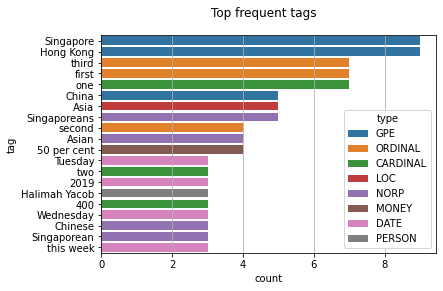

In [48]:
tags_list = dft["tags"].sum()

map_lst = list(map(lambda x: list(x.keys())[0], tags_list))
dft_tags = pd.DataFrame(map_lst, columns=['tag','type'])
dft_tags["count"] = 1
dft_tags = dft_tags.groupby(['type','tag']).count().reset_index().sort_values("count", 
                                                                     ascending=False)
fig, ax = plt.subplots()
fig.suptitle("Top frequent tags", fontsize=12)
sns.barplot(x="count", y="tag", hue="type", 
            data=dft_tags.iloc[:20,:], dodge=False, ax=ax)
ax.grid(axis="x")
plt.show()

In [49]:
#tags_list

In [50]:
dft_tags[dft_tags['type']=='PERSON']

,type,tag,count
464,PERSON,Halimah Yacob,3
483,PERSON,Millennium Hotels,2
480,PERSON,Leung,2
449,PERSON,Chan,2
491,PERSON,Ms Raeesah Khan,1
...,...,...,...
443,PERSON,Ang Mo Kio GRC.Ms Ng,1
442,PERSON,Ang Mo Kio,1
441,PERSON,Andrew Zee,1
440,PERSON,Andrew Sheng,1


In [51]:
dft.iloc[7]

Article_No                                                                        A8
Source                                                                          SCMP
Date                                                                      2020-08-25
Country                                                                    Hong Kong
Content                            *The catering sector lost an estimated revenue...
Clean_Content                      catering sector lose estimate revenue hk$5 bil...
TextBlob_Sentiment_Polarity                                                0.0600712
TextBlob_Sentiment_Subjectivity                                             0.395236
Vader_Sentiment_Compound                                                      0.9614
Vader_Sentiment_neg                                                              0.1
Vader_Sentiment_pos                                                            0.112
Vader_Sentiment_neu                                              

### Word Cloud

In [52]:
nlp = en_core_web_sm.load()
def clean_text2(text):
    doc = nlp(text)
    tokens = [t for t in doc if not (t.is_stop|t.is_punct)]
    clean_text = ' '.join(tokens)
    return clean_text

In [53]:
# importing all necessery modules 
from wordcloud import WordCloud, STOPWORDS
from nltk.corpus import stopwords

In [54]:
SG_dft= dft[dft['Country']=='Singapore']
HK_dft= dft[dft['Country']=='Hong Kong']


In [55]:
# remove stop words, word cloud stop words are not exhaustive

def remv_stop(text, remove_stop=True):
    stop = stopwords.words('english')
   
    # Remove punctuation from text
    text = ''.join([c for c in text if c not in punctuation])
    text = text.lower() #lowercase all
    
    # Remove stop words
    if remove_stop:
            text = text.split()
            text = [w for w in text if not w in stop]
            text = " ".join(text)
    
    return text


In [56]:
# remove default words

def remove_SG(text) :
    text = text.split()
    text = [w.lower() for w in text]
    text = [w for w in text if w != 'singapore']
    text = [w for w in text if w != 'said']
    text = [w for w in text if w != 'per']
    text = [w for w in text if w != 'cent']
    text = " ".join(text)
    
    return text

In [57]:
def remove_HK(text) :
    text = text.split()
    text = [w.lower() for w in text]
    text = [w for w in text if w != 'hong']
    text = [w for w in text if w != 'kong']
    text = [w for w in text if w != 'said']
    text = [w for w in text if w != 'per']
    text = [w for w in text if w != 'cent']
    text = " ".join(text)
    
    return text

In [58]:
SG_dft['CContent'] = SG_dft['Content'].apply(remv_stop)
SG_dft['CContent'] = SG_dft['CContent'].apply(remove_SG)
SG_dft

,Article_No,Source,Date,Country,Content,Clean_Content,TextBlob_Sentiment_Polarity,TextBlob_Sentiment_Subjectivity,Vader_Sentiment_Compound,Vader_Sentiment_neg,...,tags_ORDINAL,tags_QUANTITY,tags_TIME,tags_EVENT,tags_FAC,tags_PERSON,tags_LAW,tags_DATE,tags_ORG,CContent
2,A3,CNA,2020-09-01,Singapore,SINGAPORE: Residents in Singapore and Brunei c...,singapore resident singapore brunei soon trave...,-0.084794,0.311697,0.8020,0.032,...,0,0,1,0,0,0,0,7,2,residents brunei soon travel two countries ess...
3,A4,CNA,2020-08-19,Singapore,SINGAPORE: Millennium Hotels and Resorts has l...,singapore millennium hotels resorts lay 159 em...,0.061568,0.355303,0.9364,0.058,...,1,0,0,0,1,4,0,8,34,millennium hotels resorts laid 159 employees e...
4,A5,CNA,2020-08-24,Singapore,SINGAPORE: A younger and more gender-diverse P...,singapore young gender diverse parliament open...,0.116281,0.408497,0.9984,0.049,...,13,0,2,2,0,28,0,24,53,younger genderdiverse parliament opens monday ...
8,A9,SCMP,2020-09-02,Singapore,"*Citing 'wisdom after the fact' to parliament,...",cite wisdom fact parliament lee say mandate we...,0.152340,0.448464,0.8272,0.080,...,1,0,0,0,0,10,0,5,3,citing wisdom fact parliament lee says mandate...
9,A10,SCMP,2020-08-19,Singapore,High-visibility projects like Marina Bay The F...,high visibility project like marina bay fuller...,0.125848,0.406643,0.9982,0.017,...,2,0,0,0,4,13,0,17,21,highvisibility projects like marina bay fuller...
12,A13,YAHOO,2020-08-27,Singapore,(Bloomberg) -- Singapore has long been the cit...,bloomberg singapore long city choice western e...,0.098780,0.426536,0.9941,0.062,...,3,0,0,0,0,14,0,22,16,bloomberg long city choice western expats want...
13,A14,YAHOO,2020-08-30,Singapore,AUGUST 30 - They say only death and taxes are ...,august 30 death taxis certain life fact avoid ...,0.100244,0.428730,0.9637,0.076,...,1,0,0,0,0,0,0,9,0,august 30 say death taxes certain life though ...
14,A15,YAHOO,2020-08-29,Singapore,The Monetary Authority of Singapore (MAS) said...,monetary authority singapore mas say seek anch...,0.099154,0.259945,0.9969,0.036,...,0,0,0,0,0,5,0,4,17,monetary authority mas seeks anchor economic f...


In [59]:
HK_dft['CContent'] = HK_dft['Content'].apply(remv_stop)
HK_dft['CContent'] = HK_dft['CContent'].apply(remove_HK)
HK_dft

,Article_No,Source,Date,Country,Content,Clean_Content,TextBlob_Sentiment_Polarity,TextBlob_Sentiment_Subjectivity,Vader_Sentiment_Compound,Vader_Sentiment_neg,...,tags_ORDINAL,tags_QUANTITY,tags_TIME,tags_EVENT,tags_FAC,tags_PERSON,tags_LAW,tags_DATE,tags_ORG,CContent
0,A1,CNA,2020-09-02,Hong Kong,['HONG KONG: Hong Kong will reopen gyms and ma...,hong kong hong kong reopen gym massage parlour...,0.022451,0.349177,0.6310,0.047,...,2,0,3,0,1,4,0,12,2,reopen gyms massage parlours extend nighttime ...
1,A2,CNA,2020-08-31,Hong Kong,"HONG KONG: In 1960, the Nobel laureate economi...",hong kong 1960 nobel laureate economist ronald...,0.067869,0.365237,0.9895,0.051,...,3,0,0,0,0,4,0,6,8,1960 nobel laureate economist ronald h coase i...
5,A6,SCMP,2020-09-02,Hong Kong,As the Covid-19 pandemic continues to overwhel...,covid-19 pandemic continue overwhelm economy a...,0.077108,0.369756,0.8554,0.051,...,0,0,0,1,0,0,0,11,3,covid19 pandemic continues overwhelm economies...
6,A7,SCMP,2020-08-20,Hong Kong,*Eight months since the start of the Covid-19 ...,month start covid-19 outbreak coach give measl...,0.067047,0.392764,0.9964,0.062,...,8,0,0,0,0,16,0,18,12,eight months since start covid19 outbreak coac...
7,A8,SCMP,2020-08-25,Hong Kong,*The catering sector lost an estimated revenue...,catering sector lose estimate revenue hk$5 bil...,0.060071,0.395236,0.9614,0.100,...,5,5,6,0,0,15,0,16,8,catering sector lost estimated revenue hk5 bil...
10,A11,YAHOO,2020-09-02,Hong Kong,I am a Hong Kong trained doctor and have worke...,hong kong train doctor work decade number publ...,0.029087,0.320810,-0.9984,0.215,...,2,1,1,0,0,1,1,4,3,trained doctor worked decade number public hos...
11,A12,YAHOO,2020-08-31,Hong Kong,Hong Kong pro-democracy activists and healthca...,hong kong pro democracy activist healthcare wo...,0.064848,0.383361,-0.9928,0.130,...,1,0,1,0,0,5,0,7,2,prodemocracy activists healthcare workers call...


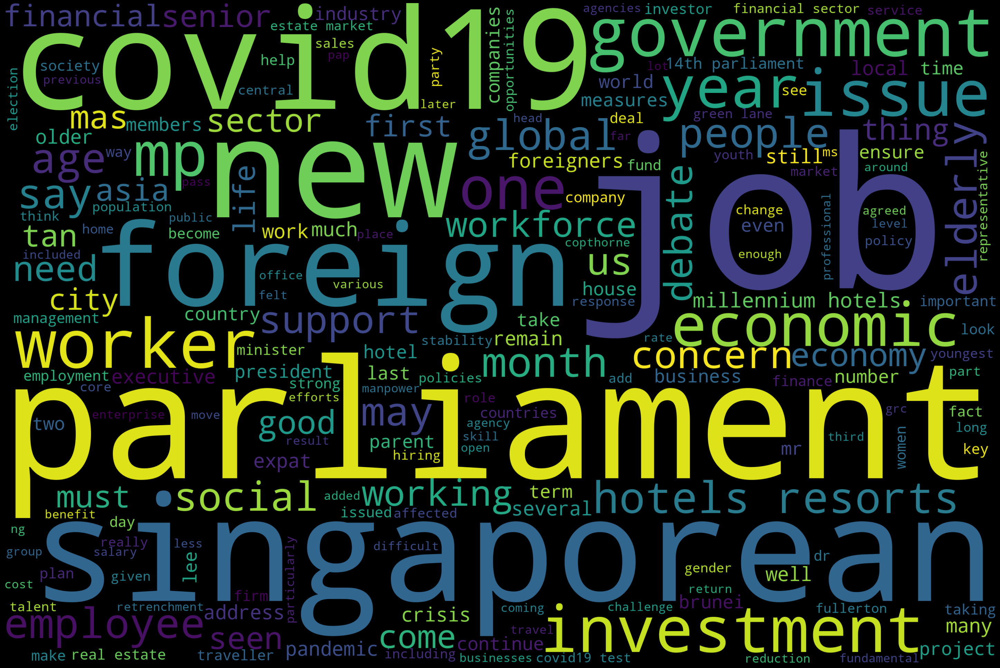

In [60]:
# Word Cloud of SG sub-dataframe
text1 = SG_dft.CContent.values
wordcloud = WordCloud(width = 3000, height = 2000,
                        background_color = 'black',
                        stopwords = STOPWORDS).generate(str(text1))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

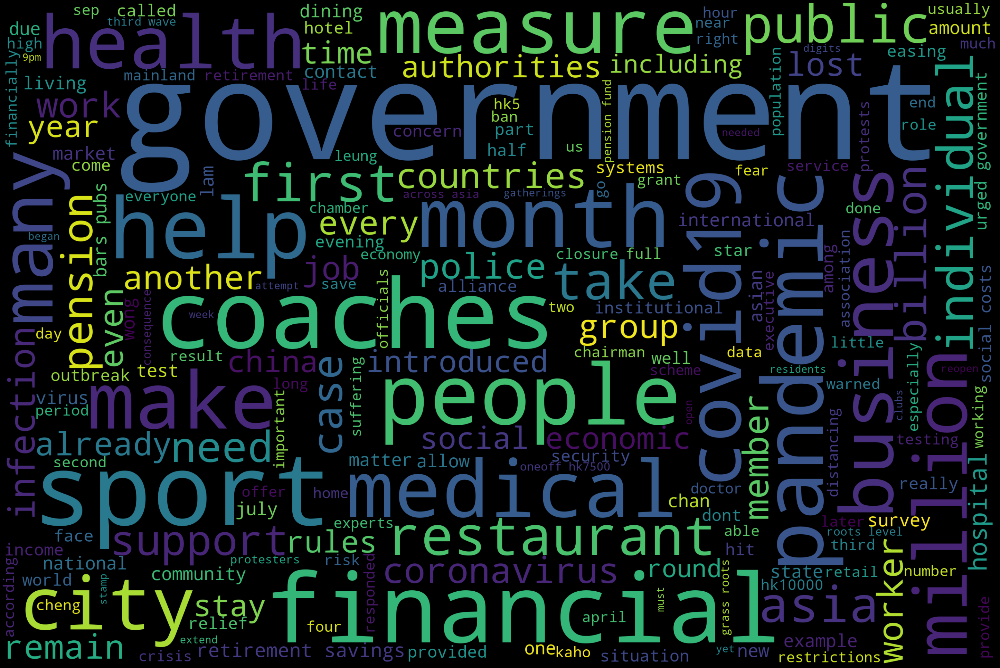

In [61]:
# Word Cloud of HK sub-dataframe
text2 = HK_dft.CContent.values
wordcloud = WordCloud(width = 3000, height = 2000,
                        background_color = 'black',
                        stopwords = STOPWORDS).generate(str(text2))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

In [62]:
# create a bar chart of the frequency of the words in the text
def plot_words(tokens, top = 30):
    tokens_counter = Counter(tokens)
    tok = [t for (t, _) in tokens_counter.most_common()]
    val = [v for (_, v) in tokens_counter.most_common()]

    plt.figure(figsize = (16, 6))
    plt.bar(tok[:top], val[:top])
    plt.title('Number of terms: %d' % len(tokens_counter))
    plt.xticks(rotation = 90)

    plt.show()

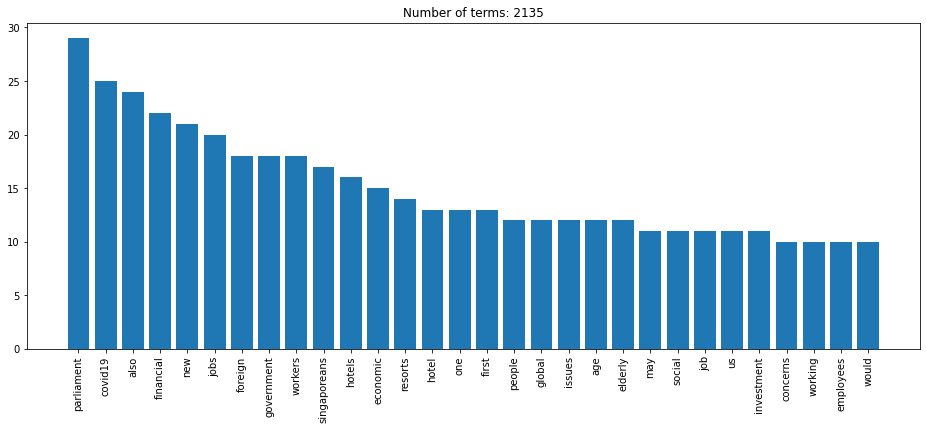

In [63]:
# Word frequency of SG sub-dataframe
sg_tokens = nltk.word_tokenize(str(text1))
plot_words(sg_tokens)

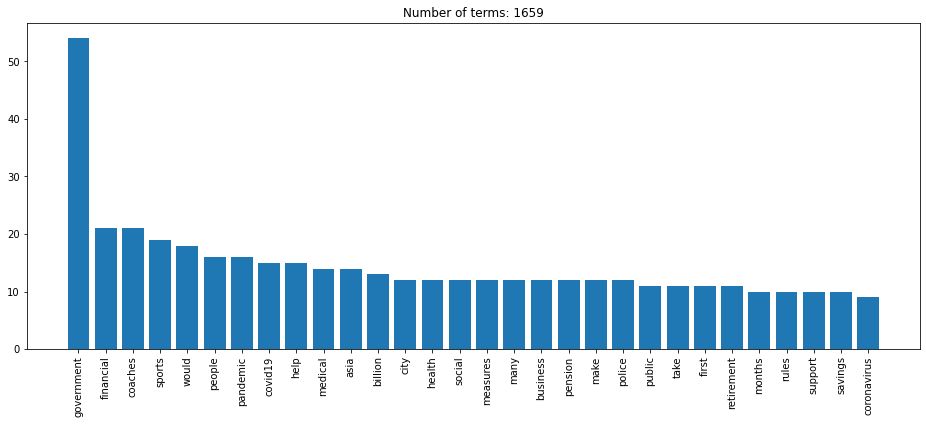

In [64]:
# Word frequency of HK sub-dataframe
hk_tokens = nltk.word_tokenize(str(text2))
plot_words(hk_tokens)

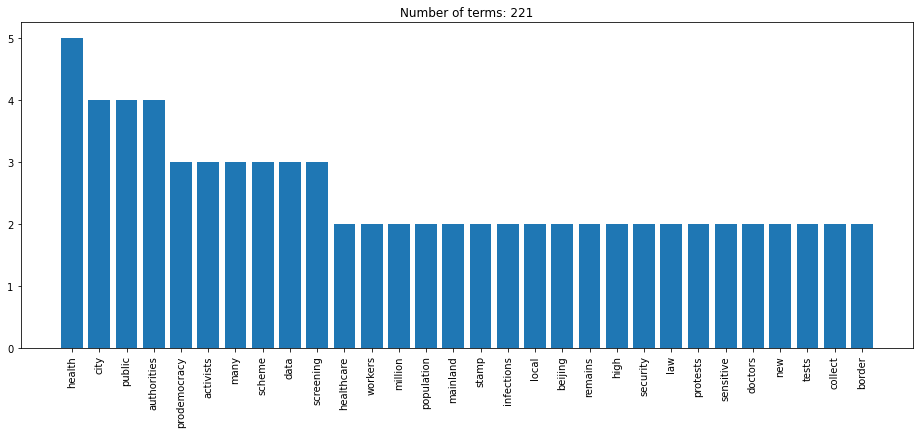

In [65]:
# HK A12
text4 = HK_dft.loc[11].at['CContent']
hk_tokens = nltk.word_tokenize(str(text4))
plot_words(hk_tokens)

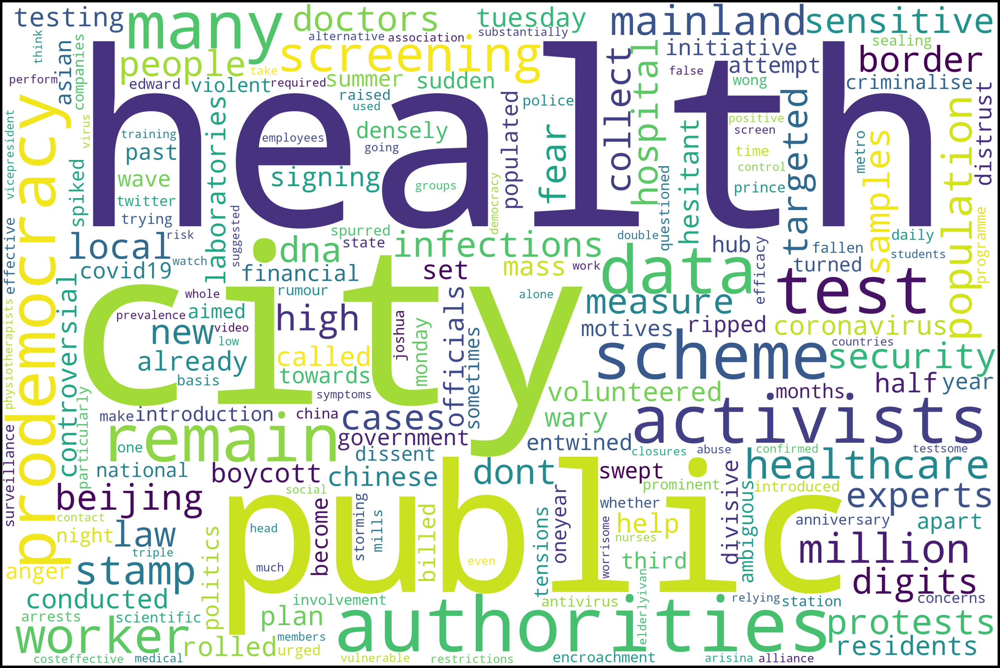

In [88]:
wordcloud = WordCloud(width = 3000, height = 2000,
                        background_color = 'white',
                        stopwords = STOPWORDS).generate(str(text4))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

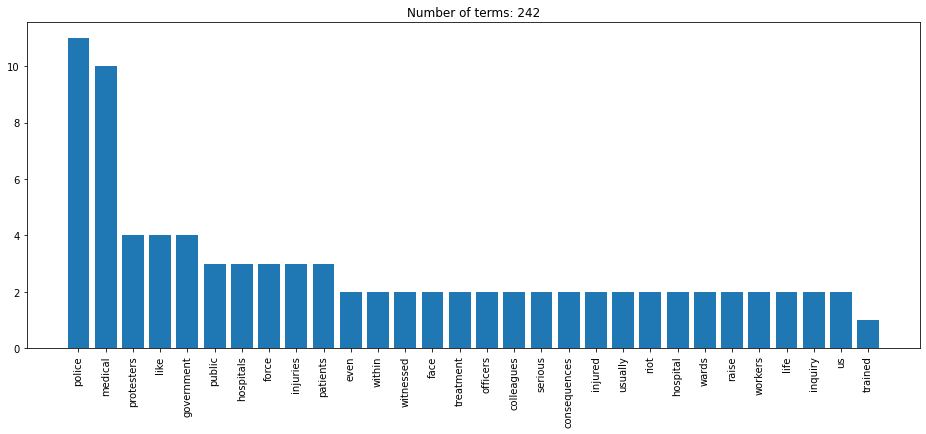

In [67]:
# HK A11
text5 = HK_dft.loc[10].at['CContent']

hk_tokens = nltk.word_tokenize(str(text5))
plot_words(hk_tokens)


In [117]:
# Confirmation article A11 contains Covid-19

# Search the original content
test_Content = HK_dft.loc[10].at['Content']
print('Content:')
print(test_Content.find('Covid-19'))
print(test_Content[2586:2594])

# Search the clean content
test_Clean = HK_dft.loc[10].at['Clean_Content']
print('Clean_Content:')
print(test_Clean.find('covid-19'))
print(test_Clean[1607:1615])

# Search the ccontent
test_CClean = HK_dft.loc[10].at['CContent']
print('CContent:')
print(test_CClean.find('covid19'))
print(test_CClean[1817:1825])



Content:
2586
Covid-19
Clean_Content:
1607
covid-19
CContent:
1817
covid19 


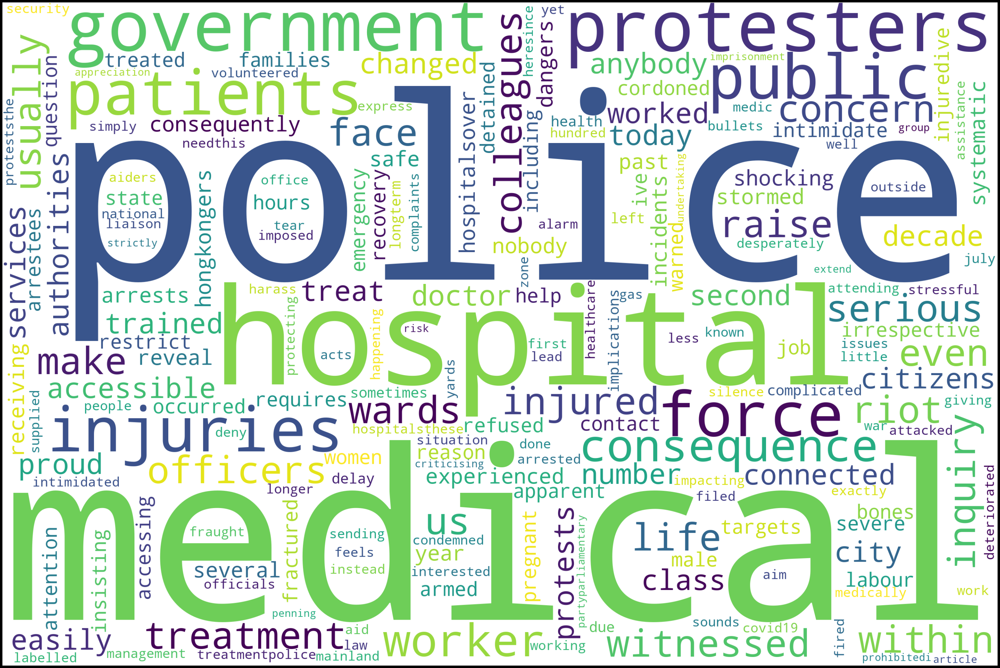

In [89]:
wordcloud = WordCloud(width = 3000, height = 2000,
                        background_color = 'white',
                        stopwords = STOPWORDS).generate(str(text5))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

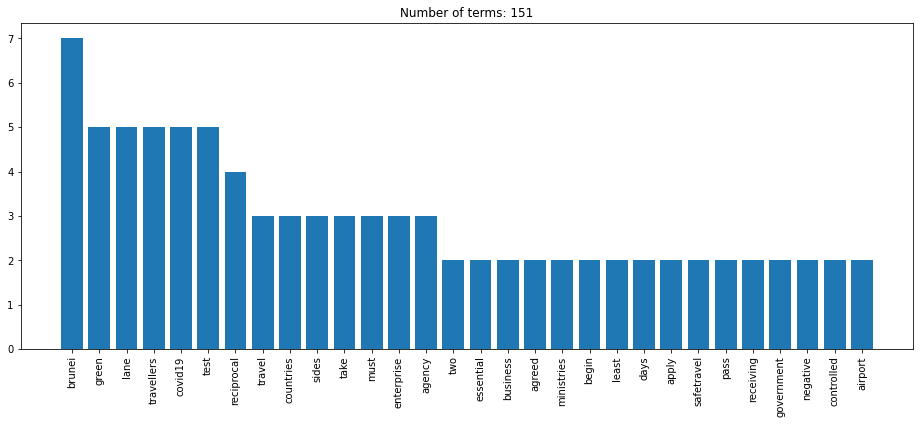

In [69]:
# SG A3
text6 = SG_dft.loc[2].at['CContent']

sg_tokens = nltk.word_tokenize(str(text6))
plot_words(sg_tokens)


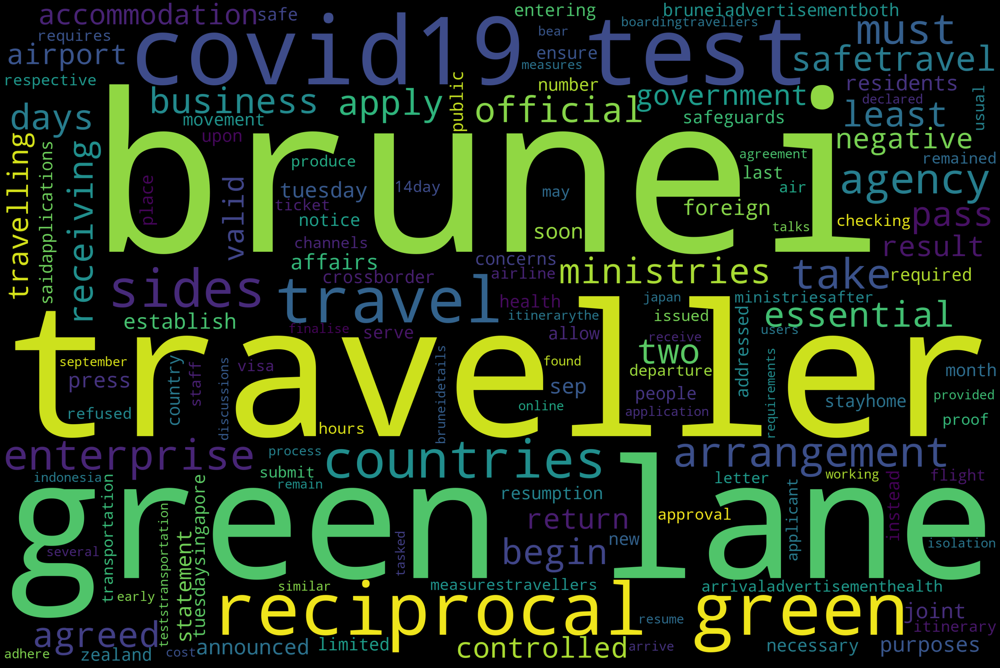

In [70]:
wordcloud = WordCloud(width = 3000, height = 2000,
                        background_color = 'black',
                        stopwords = STOPWORDS).generate(str(text6))
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

### Visualisations

In [71]:
#SG_dft.info()

In [72]:
#SG_dft

In [73]:
# Singapore Sentiments - Vader
sortedSG = SG_dft.sort_values(by=['Date'])
x = SG_dft['Article_No']
y1 = SG_dft['Vader_Sentiment_Compound']
y2 = SG_dft['Vader_Sentiment']


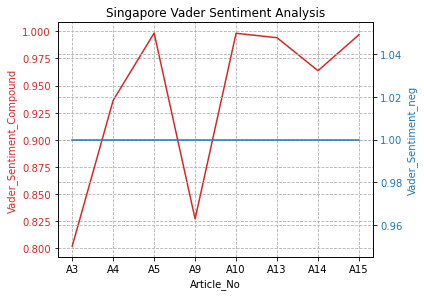

In [74]:
# plot x and both ys
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Article_No')
ax1.set_ylabel('Vader_Sentiment_Compound', color=color)
ax1.plot(x, y1, color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(which='major', axis='both', linestyle='--')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_xlabel('Article_No')
ax2.set_ylabel('Vader_Sentiment_neg', color=color)
ax2.plot(x, y2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.grid(which='major', axis='both', linestyle='--')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('Singapore Vader Sentiment Analysis')
plt.show()

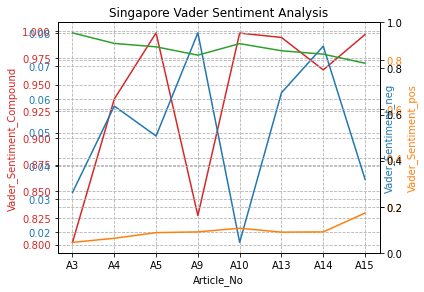

In [75]:
# plot x and both ys
x = SG_dft['Article_No']
y1 = SG_dft['Vader_Sentiment_Compound']
y2 = SG_dft['Vader_Sentiment_neg']
y3 = SG_dft['Vader_Sentiment_neu']
y4 = SG_dft['Vader_Sentiment_pos']

fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Article_No')
ax1.set_ylabel('Vader_Sentiment_Compound', color=color)
ax1.plot(x, y1, color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(which='major', axis='both', linestyle='--')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax3 = ax2.twinx()
ax4 = ax2.twinx()

color = 'tab:blue'
ax2.set_xlabel('Article_No')
ax2.set_ylabel('Vader_Sentiment_neg', color=color)
ax2.plot(x, y2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.grid(which='major', axis='both', linestyle='--')


color = 'tab:green'
ax3.set_xlabel('Article_No')
ax3.set_ylabel('Vader_Sentiment_neu', color=color)
ax3.plot(x, y3, color=color)
ax3.tick_params(axis='y', labelcolor=color)
ax3.grid(which='major', axis='both', linestyle='--')


color = 'tab:orange'
ax3.set_xlabel('Article_No')
ax3.set_ylabel('Vader_Sentiment_pos', color=color)
ax3.plot(x, y4, color=color)
ax3.tick_params(axis='y', labelcolor=color)
ax3.grid(which='major', axis='both', linestyle='--')


fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('Singapore Vader Sentiment Analysis')
plt.show()

<Figure size 576x576 with 0 Axes>

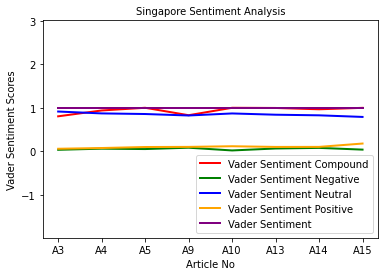

In [127]:

x = SG_dft['Article_No']
y1 = SG_dft['Vader_Sentiment_Compound']
y2 = SG_dft['Vader_Sentiment_neg']
y3 = SG_dft['Vader_Sentiment_neu']
y4 = SG_dft['Vader_Sentiment_pos']
y5 = SG_dft['Vader_Sentiment']

plt.figure(figsize=[8,8])

fig, ax = plt.subplots()

ax.plot(x, y1, color='red', lw = 2, label = 'Vader Sentiment Compound')
ax.plot(x, y2, color='green', lw = 2, label = 'Vader Sentiment Negative')
ax.plot(x, y3, color='blue', lw = 2, label = 'Vader Sentiment Neutral')
ax.plot(x, y4, color='orange', lw = 2, label = 'Vader Sentiment Positive')
ax.plot(x, y5, color='purple', lw = 2, label = 'Vader Sentiment')
ax.tick_params(axis='y')

plt.xlabel('Article No', fontsize=10)
plt.ylabel('Vader Sentiment Scores', fontsize=10)
plt.title('Singapore Sentiment Analysis', fontsize=10)
ax.axis('equal')
leg = ax.legend(loc='lower right');
plt.show()

<Figure size 576x576 with 0 Axes>

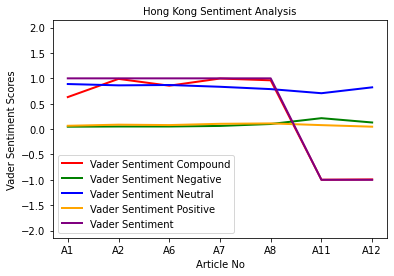

In [128]:
# HK Sentiments - Vader
x = HK_dft['Article_No']
y1 = HK_dft['Vader_Sentiment_Compound']
y2 = HK_dft['Vader_Sentiment_neg']
y3 = HK_dft['Vader_Sentiment_neu']
y4 = HK_dft['Vader_Sentiment_pos']
y5 = HK_dft['Vader_Sentiment']

plt.figure(figsize=[8,8])

fig, ax = plt.subplots()

ax.plot(x, y1, color='red', lw = 2, label = 'Vader Sentiment Compound')
ax.plot(x, y2, color='green', lw = 2, label = 'Vader Sentiment Negative')
ax.plot(x, y3, color='blue', lw = 2, label = 'Vader Sentiment Neutral')
ax.plot(x, y4, color='orange', lw = 2, label = 'Vader Sentiment Positive')
ax.plot(x, y5, color='purple', lw = 2, label = 'Vader Sentiment')
ax.tick_params(axis='y')

plt.xlabel('Article No', fontsize=10)
plt.ylabel('Vader Sentiment Scores', fontsize=10)
plt.title('Hong Kong Sentiment Analysis', fontsize=10)
ax.axis('equal')
leg = ax.legend(loc='lower left');
plt.show()

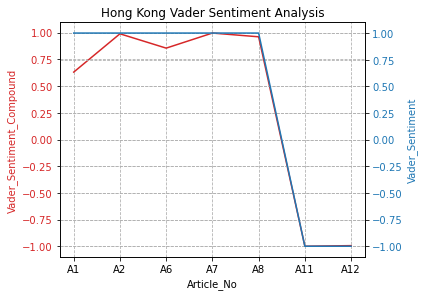

In [78]:
x = HK_dft['Article_No']
y1 = HK_dft['Vader_Sentiment_Compound']
y2 = HK_dft['Vader_Sentiment_neg']
y3 = HK_dft['Vader_Sentiment_neu']
y4 = HK_dft['Vader_Sentiment_pos']
y5 = HK_dft['Vader_Sentiment']


# plot x and both ys
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Article_No')
ax1.set_ylabel('Vader_Sentiment_Compound', color=color)
ax1.plot(x, y1, color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(which='major', axis='both', linestyle='--')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_xlabel('Article_No')
ax2.set_ylabel('Vader_Sentiment', color=color)
ax2.plot(x, y5, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.grid(which='major', axis='both', linestyle='--')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('Hong Kong Vader Sentiment Analysis')
plt.show()

In [79]:
# Singapore Sentiments - TextBlob

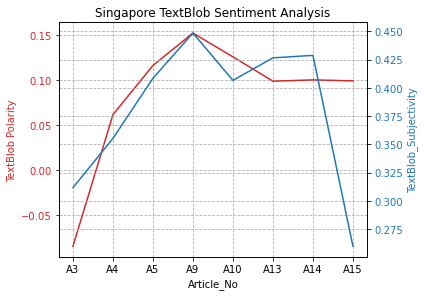

In [80]:

x = SG_dft['Article_No']
y1 = SG_dft['TextBlob_Sentiment_Polarity']
y2 = SG_dft['TextBlob_Sentiment_Subjectivity']

# plot x and both ys
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Article_No')
ax1.set_ylabel('TextBlob Polarity', color=color)
ax1.plot(x, y1, color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(which='major', axis='both', linestyle='--')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_xlabel('Article_No')
ax2.set_ylabel('TextBlob_Subjectivity', color=color)
ax2.plot(x, y2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.grid(which='major', axis='both', linestyle='--')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('Singapore TextBlob Sentiment Analysis')
plt.show()

In [81]:
SG_dft.filter(items = ['Article_No','TextBlob_Sentiment_Polarity','TextBlob_Sentiment_Subjectivity', 
                      'Vader_Sentiment','Vader_Sentiment_Compound','Vader_Sentiment_neg','Vader_Sentiment_neu','Vader_Sentiment_pos'])

,Article_No,TextBlob_Sentiment_Polarity,TextBlob_Sentiment_Subjectivity,Vader_Sentiment,Vader_Sentiment_Compound,Vader_Sentiment_neg,Vader_Sentiment_neu,Vader_Sentiment_pos
2,A3,-0.084794,0.311697,1,0.8020,0.032,0.912,0.056
3,A4,0.061568,0.355303,1,0.9364,0.058,0.869,0.073
4,A5,0.116281,0.408497,1,0.9984,0.049,0.855,0.096
8,A9,0.152340,0.448464,1,0.8272,0.080,0.821,0.099
9,A10,0.125848,0.406643,1,0.9982,0.017,0.868,0.114
12,A13,0.098780,0.426536,1,0.9941,0.062,0.839,0.098
13,A14,0.100244,0.428730,1,0.9637,0.076,0.825,0.099
14,A15,0.099154,0.259945,1,0.9969,0.036,0.788,0.176


In [129]:
# Hong Kong Sentiments - TextBlob

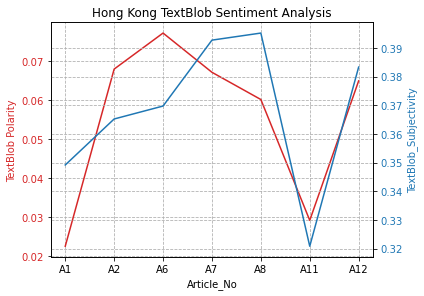

In [130]:
x = HK_dft['Article_No']
y1 = HK_dft['TextBlob_Sentiment_Polarity']
y2 = HK_dft['TextBlob_Sentiment_Subjectivity']

# plot x and both ys
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Article_No')
ax1.set_ylabel('TextBlob Polarity', color=color)
ax1.plot(x, y1, color=color)
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(which='major', axis='both', linestyle='--')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_xlabel('Article_No')
ax2.set_ylabel('TextBlob_Subjectivity', color=color)
ax2.plot(x, y2, color=color)
ax2.tick_params(axis='y', labelcolor=color)
ax2.grid(which='major', axis='both', linestyle='--')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('Hong Kong TextBlob Sentiment Analysis')
plt.show()

In [82]:
HK_dft.filter(items = ['Article_No','Date','TextBlob_Sentiment_Polarity','TextBlob_Sentiment_Subjectivity', 
                      'Vader_Sentiment','Vader_Sentiment_Compound','Vader_Sentiment_neg','Vader_Sentiment_neu','Vader_Sentiment_pos'])

,Article_No,Date,TextBlob_Sentiment_Polarity,TextBlob_Sentiment_Subjectivity,Vader_Sentiment,Vader_Sentiment_Compound,Vader_Sentiment_neg,Vader_Sentiment_neu,Vader_Sentiment_pos
0,A1,2020-09-02,0.022451,0.349177,1,0.6310,0.047,0.888,0.065
1,A2,2020-08-31,0.067869,0.365237,1,0.9895,0.051,0.862,0.087
5,A6,2020-09-02,0.077108,0.369756,1,0.8554,0.051,0.869,0.079
6,A7,2020-08-20,0.067047,0.392764,1,0.9964,0.062,0.834,0.104
7,A8,2020-08-25,0.060071,0.395236,1,0.9614,0.100,0.788,0.112
10,A11,2020-09-02,0.029087,0.320810,-1,-0.9984,0.215,0.707,0.078
11,A12,2020-08-31,0.064848,0.383361,-1,-0.9928,0.130,0.823,0.047


In [131]:
# Sensitivity Analysis by Dates

In [83]:
date_HK = HK_dft.groupby('Date').agg({'TextBlob_Sentiment_Polarity':'mean', 
                           'TextBlob_Sentiment_Subjectivity' :'mean',
                           
                           'Vader_Sentiment_Compound': 'mean',
                           'Vader_Sentiment_neg': 'mean',
                           'Vader_Sentiment_neu': 'mean',
                           'Vader_Sentiment_pos': 'mean'})
date_HK['Vader_Sentiment'] = date_HK['Vader_Sentiment_Compound'].apply(lambda x: 1 if x >= 0.05 else (-1 if x <= -0.05 else 0 ))
date_HK

,TextBlob_Sentiment_Polarity,TextBlob_Sentiment_Subjectivity,Vader_Sentiment_Compound,Vader_Sentiment_neg,Vader_Sentiment_neu,Vader_Sentiment_pos,Vader_Sentiment
Date,,,,,,,
2020-08-20,0.067047,0.392764,0.996400,0.062000,0.834000,0.104,1
2020-08-25,0.060071,0.395236,0.961400,0.100000,0.788000,0.112,1
2020-08-31,0.066359,0.374299,-0.001650,0.090500,0.842500,0.067,0
2020-09-02,0.042882,0.346581,0.162667,0.104333,0.821333,0.074,1


In [84]:
date_SG = SG_dft.groupby('Date').agg({'TextBlob_Sentiment_Polarity':'mean', 
                           'TextBlob_Sentiment_Subjectivity' :'mean',
                           
                           'Vader_Sentiment_Compound': 'mean',
                           'Vader_Sentiment_neg': 'mean',
                           'Vader_Sentiment_neu': 'mean',
                           'Vader_Sentiment_pos': 'mean'})
date_SG['Vader_Sentiment'] = date_SG['Vader_Sentiment_Compound'].apply(lambda x: 1 if x >= 0.05 else (-1 if x <= -0.05 else 0 ))
date_SG

,TextBlob_Sentiment_Polarity,TextBlob_Sentiment_Subjectivity,Vader_Sentiment_Compound,Vader_Sentiment_neg,Vader_Sentiment_neu,Vader_Sentiment_pos,Vader_Sentiment
Date,,,,,,,
2020-08-19,0.093708,0.380973,0.9673,0.0375,0.8685,0.0935,1
2020-08-24,0.116281,0.408497,0.9984,0.0490,0.8550,0.0960,1
2020-08-27,0.098780,0.426536,0.9941,0.0620,0.8390,0.0980,1
2020-08-29,0.099154,0.259945,0.9969,0.0360,0.7880,0.1760,1
2020-08-30,0.100244,0.428730,0.9637,0.0760,0.8250,0.0990,1
2020-09-01,-0.084794,0.311697,0.8020,0.0320,0.9120,0.0560,1
2020-09-02,0.152340,0.448464,0.8272,0.0800,0.8210,0.0990,1


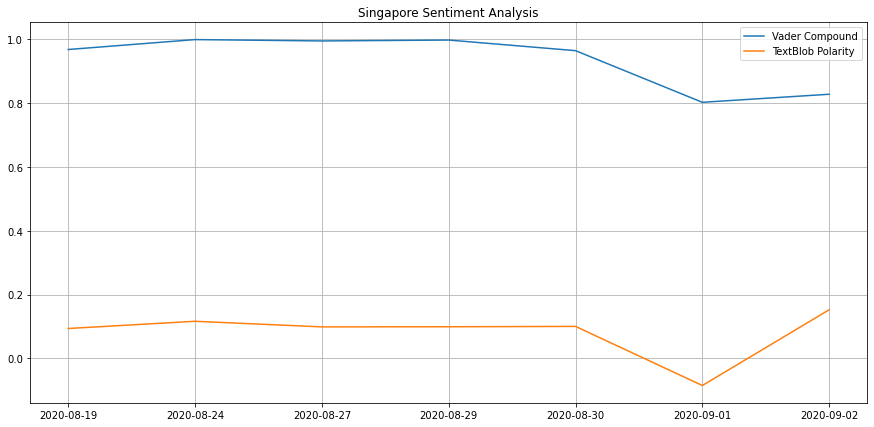

In [85]:
plt.figure(figsize=(15, 7))

plt.plot(date_SG.Vader_Sentiment_Compound, label = 'Vader Compound')
plt.plot(date_SG.TextBlob_Sentiment_Polarity, label = 'TextBlob Polarity')
plt.title('Singapore Sentiment Analysis')
plt.legend()
plt.grid(True)
plt.show()

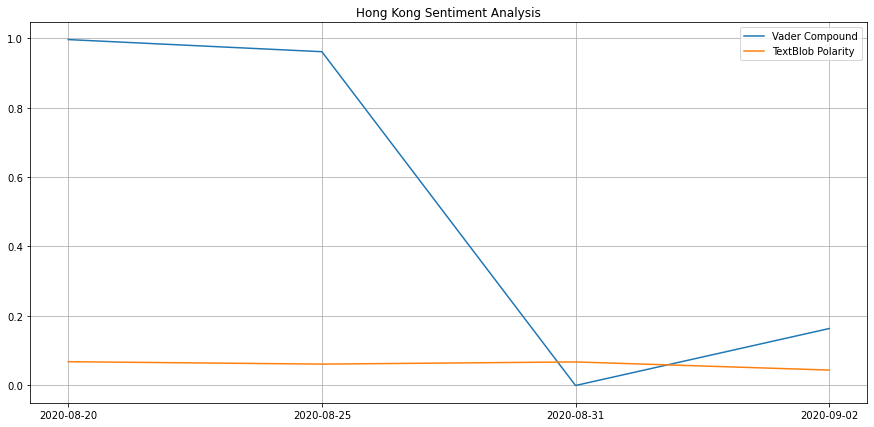

In [86]:
plt.figure(figsize=(15, 7))
plt.plot(date_HK.Vader_Sentiment_Compound, label = 'Vader Compound')
plt.plot(date_HK.TextBlob_Sentiment_Polarity, label = 'TextBlob Polarity')
plt.title('Hong Kong Sentiment Analysis')
plt.legend()
plt.grid(True)
plt.show()

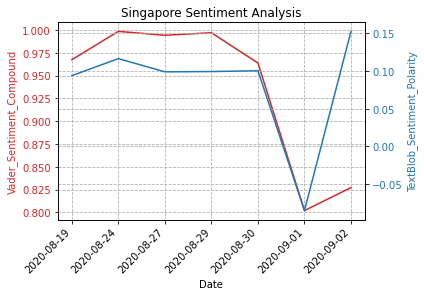

In [126]:
# plot x and both ys
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('Vader_Sentiment_Compound', color=color)
ax1.plot(date_SG.Vader_Sentiment_Compound, color=color, label = 'Vader Compound')
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(which='major', axis='both', linestyle='--')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_xlabel('Date')
ax2.set_ylabel('TextBlob_Sentiment_Polarity', color=color)
plt.plot(date_SG.TextBlob_Sentiment_Polarity, color=color, label = 'TextBlob Polarity')
ax2.tick_params(axis='y', labelcolor=color)
ax2.grid(which='major', axis='both', linestyle='--')

fig.autofmt_xdate(rotation=45)
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('Singapore Sentiment Analysis')
plt.show()

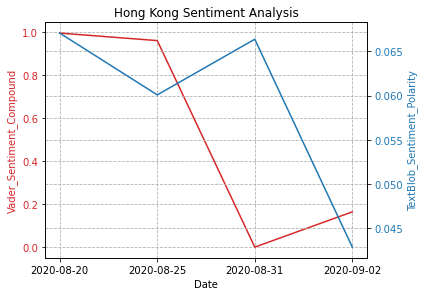

In [122]:
# plot x and both ys
fig, ax1 = plt.subplots()

color = 'tab:red'
ax1.set_xlabel('Date')
ax1.set_ylabel('Vader_Sentiment_Compound', color=color)
ax1.plot(date_HK.Vader_Sentiment_Compound, color=color, label = 'Vader Compound')
ax1.tick_params(axis='y', labelcolor=color)
ax1.grid(which='major', axis='both', linestyle='--')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_xlabel('Date')
ax2.set_ylabel('TextBlob_Sentiment_Polarity', color=color)
plt.plot(date_HK.TextBlob_Sentiment_Polarity, color=color, label = 'TextBlob Polarity')
ax2.tick_params(axis='y', labelcolor=color)
ax2.grid(which='major', axis='both', linestyle='--')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.title('Hong Kong Sentiment Analysis')
plt.show()

In [ ]:
# NER tags for SG and HK sub-dataframes

In [135]:
print('SG NER :')
print('tags_NORP :', SG_dft['tags_NORP'].sum())
print('tags_WORK_OF_ART :', SG_dft['tags_WORK_OF_ART'].sum())
print('tags_LOC :', SG_dft['tags_LOC'].sum())
print('tags_PRODUCT :', SG_dft['tags_PRODUCT'].sum())
print('tags_MONEY :', SG_dft['tags_MONEY'].sum())
print('tags_GPE :', SG_dft['tags_GPE'].sum())
print('tags_EVENT :', SG_dft['tags_EVENT'].sum())
print('tags_FAC :', SG_dft['tags_FAC'].sum())
print('tags_PERSON :', SG_dft['tags_PERSON'].sum())
print('tags_LAW :', SG_dft['tags_LAW'].sum())
print('tags_ORG :', SG_dft['tags_ORG'].sum())



SG NER :
tags_NORP : 26
tags_WORK_OF_ART : 3
tags_LOC : 18
tags_PRODUCT : 2
tags_MONEY : 20
tags_GPE : 101
tags_EVENT : 2
tags_FAC : 5
tags_PERSON : 74
tags_LAW : 0
tags_ORG : 146


In [136]:
print('HK NER :')
print('tags_NORP :', HK_dft['tags_NORP'].sum())
print('tags_WORK_OF_ART :', HK_dft['tags_WORK_OF_ART'].sum())
print('tags_LOC :', HK_dft['tags_LOC'].sum())
print('tags_PRODUCT :', HK_dft['tags_PRODUCT'].sum())
print('tags_MONEY :', HK_dft['tags_MONEY'].sum())
print('tags_GPE :', HK_dft['tags_GPE'].sum())
print('tags_EVENT :', HK_dft['tags_EVENT'].sum())
print('tags_FAC :', HK_dft['tags_FAC'].sum())
print('tags_PERSON :', HK_dft['tags_PERSON'].sum())
print('tags_LAW :', HK_dft['tags_LAW'].sum())
print('tags_ORG :', HK_dft['tags_ORG'].sum())


HK NER :
tags_NORP : 13
tags_WORK_OF_ART : 1
tags_LOC : 14
tags_PRODUCT : 1
tags_MONEY : 36
tags_GPE : 70
tags_EVENT : 1
tags_FAC : 1
tags_PERSON : 45
tags_LAW : 1
tags_ORG : 38
